# **Import Library**


In [1]:
#ignore warnings
import warnings
warnings.filterwarnings('ignore')

#standard Libraries
import pandas as pd
import numpy as np

#visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (10,8)

from collections import Counter

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

import xgboost as xgb
from xgboost import XGBClassifier

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn import metrics


In [2]:
#from google.colab import drive
#drive.mount('/content/drive')

In [3]:
# train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/cse498r/human activities/train.csv')  #zara's path
# test = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/cse498r/human activities/test.csv')    #zara's path

#train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/CSE498R/train.csv')   #Baker's Path
#test = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/CSE498R/test.csv')     #Baker's Path

#train = pd.read_csv('/content/drive/MyDrive/final dataset/train.csv')
#test = pd.read_csv('/content/drive/MyDrive/final dataset/test.csv')
train = pd.read_csv('E:/CSE498R/final dataseet/test.csv')
test = pd.read_csv('E:/CSE498R/final dataseet/train.csv')


**Understanding the data**


In [4]:
#see what is present in the data
train.head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
0,0.257178,-0.023285,-0.014654,-0.938404,-0.920091,-0.667683,-0.952501,-0.925249,-0.674302,-0.894088,...,-0.705974,0.006462,0.162920,-0.825886,0.271151,-0.720009,0.276801,-0.057978,2,STANDING
1,0.286027,-0.013163,-0.119083,-0.975415,-0.967458,-0.944958,-0.986799,-0.968401,-0.945823,-0.894088,...,-0.594944,-0.083495,0.017500,-0.434375,0.920593,-0.698091,0.281343,-0.083898,2,STANDING
2,0.275485,-0.026050,-0.118152,-0.993819,-0.969926,-0.962748,-0.994403,-0.970735,-0.963483,-0.939260,...,-0.640736,-0.034956,0.202302,0.064103,0.145068,-0.702771,0.280083,-0.079346,2,STANDING
3,0.270298,-0.032614,-0.117520,-0.994743,-0.973268,-0.967091,-0.995274,-0.974471,-0.968897,-0.938610,...,-0.736124,-0.017067,0.154438,0.340134,0.296407,-0.698954,0.284114,-0.077108,2,STANDING
4,0.274833,-0.027848,-0.129527,-0.993852,-0.967445,-0.978295,-0.994111,-0.965953,-0.977346,-0.938610,...,-0.846595,-0.002223,-0.040046,0.736715,-0.118545,-0.692245,0.290722,-0.073857,2,STANDING


In [5]:
#see what is present in the data
train.tail()


,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
2942,0.310155,-0.053391,-0.099109,-0.287866,-0.140589,-0.215088,-0.356083,-0.148775,-0.232057,0.185361,...,-0.750809,-0.337422,0.346295,0.884904,-0.698885,-0.651732,0.274627,0.184784,24,WALKING_UPSTAIRS
2943,0.363385,-0.039214,-0.105915,-0.305388,0.028148,-0.196373,-0.373540,-0.030036,-0.270237,0.185361,...,-0.700274,-0.736701,-0.372889,-0.657421,0.322549,-0.655181,0.273578,0.182412,24,WALKING_UPSTAIRS
2944,0.349966,0.030077,-0.115788,-0.329638,-0.042143,-0.250181,-0.388017,-0.133257,-0.347029,0.007471,...,-0.467179,-0.181560,0.088574,0.696663,0.363139,-0.655357,0.274479,0.181184,24,WALKING_UPSTAIRS
2945,0.237594,0.018467,-0.096499,-0.323114,-0.229775,-0.207574,-0.392380,-0.279610,-0.289477,0.007471,...,-0.617737,0.444558,-0.819188,0.929294,-0.008398,-0.659719,0.264782,0.187563,24,WALKING_UPSTAIRS
2946,0.153627,-0.018437,-0.137018,-0.330046,-0.195253,-0.164339,-0.430974,-0.218295,-0.229933,-0.111527,...,-0.436940,0.598808,-0.287951,0.876030,-0.024965,-0.660080,0.263936,0.188103,24,WALKING_UPSTAIRS


In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2947 entries, 0 to 2946
Columns: 563 entries, tBodyAcc-mean()-X to Activity
dtypes: float64(561), int64(1), object(1)
memory usage: 12.7+ MB


In [7]:
train.shape

(2947, 563)

In [8]:
train.describe()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject
count,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,...,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000
mean,0.273996,-0.017863,-0.108386,-0.613635,-0.508330,-0.633797,-0.641278,-0.522676,-0.637038,-0.462063,...,-0.277593,-0.598756,0.005264,0.003799,0.040029,-0.017298,-0.513923,0.074886,-0.048720,12.986427
std,0.060570,0.025745,0.042747,0.412597,0.494269,0.362699,0.385199,0.479899,0.357753,0.523916,...,0.317245,0.311042,0.336147,0.445077,0.634989,0.501311,0.509205,0.324300,0.241467,6.950984
min,-0.592004,-0.362884,-0.576184,-0.999606,-1.000000,-0.998955,-0.999417,-0.999914,-0.998899,-0.952357,...,-1.000000,-1.000000,-1.000000,-0.993402,-0.998898,-0.991096,-0.984195,-0.913704,-0.949228,2.000000
25%,0.262075,-0.024961,-0.121162,-0.990914,-0.973664,-0.976122,-0.992333,-0.974131,-0.975352,-0.934447,...,-0.517494,-0.829593,-0.130541,-0.282600,-0.518924,-0.428375,-0.829722,0.022140,-0.098485,9.000000
50%,0.277113,-0.016967,-0.108458,-0.931214,-0.790972,-0.827534,-0.937664,-0.799907,-0.817005,-0.852659,...,-0.311023,-0.683672,0.005188,0.006767,0.047113,-0.026726,-0.729648,0.181563,-0.010671,12.000000
75%,0.288097,-0.010143,-0.097123,-0.267395,-0.105919,-0.311432,-0.321719,-0.133488,-0.322771,-0.009965,...,-0.083559,-0.458332,0.146200,0.288113,0.622151,0.394387,-0.545939,0.260252,0.092373,18.000000
max,0.671887,0.246106,0.494114,0.465299,1.000000,0.489703,0.439657,1.000000,0.427958,0.786436,...,1.000000,1.000000,0.998898,0.986347,1.000000,1.000000,0.833180,1.000000,0.973113,24.000000


In [9]:
train.dtypes

tBodyAcc-mean()-X       float64
tBodyAcc-mean()-Y       float64
tBodyAcc-mean()-Z       float64
tBodyAcc-std()-X        float64
tBodyAcc-std()-Y        float64
                         ...   
angle(X,gravityMean)    float64
angle(Y,gravityMean)    float64
angle(Z,gravityMean)    float64
subject                   int64
Activity                 object
Length: 563, dtype: object

In [10]:
# how many records are available for each subjects
train.subject.value_counts()

subject
24    381
18    364
20    354
13    327
12    320
4     317
2     302
10    294
9     288
Name: count, dtype: int64

In [11]:
#count how many unique value every feature have
train.nunique()

tBodyAcc-mean()-X       2947
tBodyAcc-mean()-Y       2947
tBodyAcc-mean()-Z       2947
tBodyAcc-std()-X        2947
tBodyAcc-std()-Y        2947
                        ... 
angle(X,gravityMean)    2947
angle(Y,gravityMean)    2947
angle(Z,gravityMean)    2947
subject                    9
Activity                   6
Length: 563, dtype: int64

In [12]:
train['Activity'].unique()

array(['STANDING', 'SITTING', 'LAYING', 'WALKING', 'WALKING_DOWNSTAIRS',
       'WALKING_UPSTAIRS'], dtype=object)

# **Data Preprocessing**

##Checking for Duplicates

In [13]:
print('Number of duplicates in train : ',sum(train.duplicated()))
print('Number of duplicates in test  : ',sum(test.duplicated()))

Number of duplicates in train :  0
Number of duplicates in test  :  0


##Checking for Missing Values

In [14]:
print('Number of Missing values in train : ',train.isna().values.sum())
print('Number of Missing values in test  : ',test.isna().values.sum())

Number of Missing values in train :  0
Number of Missing values in test  :  0


In [15]:
train.isnull().sum()

tBodyAcc-mean()-X       0
tBodyAcc-mean()-Y       0
tBodyAcc-mean()-Z       0
tBodyAcc-std()-X        0
tBodyAcc-std()-Y        0
                       ..
angle(X,gravityMean)    0
angle(Y,gravityMean)    0
angle(Z,gravityMean)    0
subject                 0
Activity                0
Length: 563, dtype: int64

##Checking for class imbalance¶

In [16]:
train['Activity'].value_counts()

Activity
LAYING                537
STANDING              532
WALKING               496
SITTING               491
WALKING_UPSTAIRS      471
WALKING_DOWNSTAIRS    420
Name: count, dtype: int64

here we can see our dataset is balanced

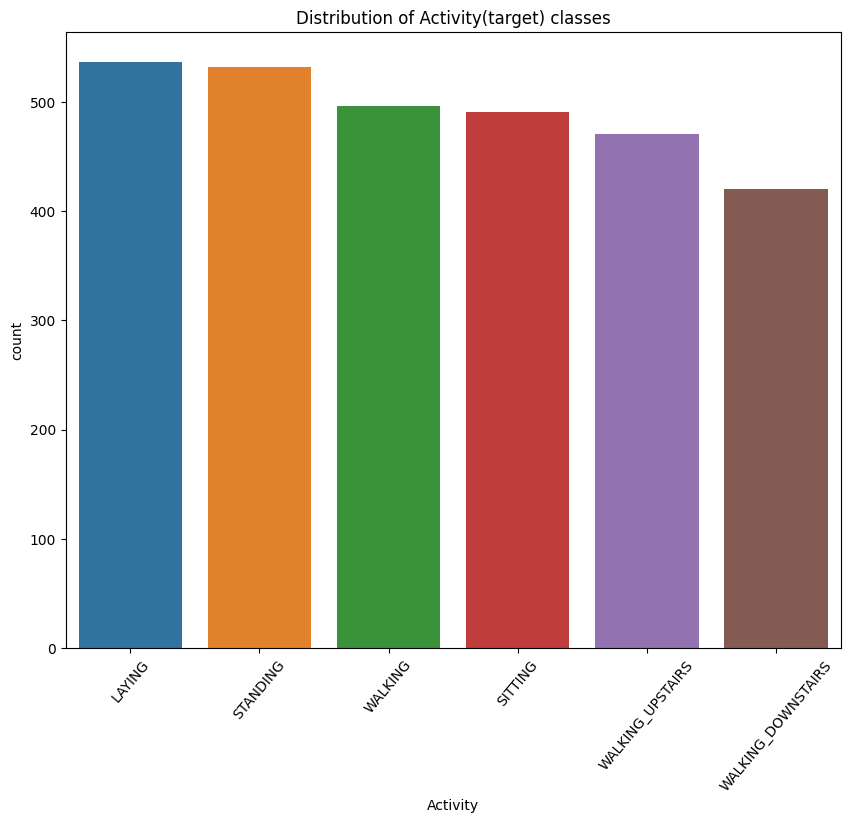

In [17]:
sns.countplot(x=train['Activity'],data=train,order =train['Activity'].value_counts().index)
plt.title('Distribution of Activity(target) classes')
plt.xticks(rotation=50)
plt.show()

# Label Encoding

In [18]:
train.columns

Index(['tBodyAcc-mean()-X', 'tBodyAcc-mean()-Y', 'tBodyAcc-mean()-Z',
       'tBodyAcc-std()-X', 'tBodyAcc-std()-Y', 'tBodyAcc-std()-Z',
       'tBodyAcc-mad()-X', 'tBodyAcc-mad()-Y', 'tBodyAcc-mad()-Z',
       'tBodyAcc-max()-X',
       ...
       'fBodyBodyGyroJerkMag-kurtosis()', 'angle(tBodyAccMean,gravity)',
       'angle(tBodyAccJerkMean),gravityMean)',
       'angle(tBodyGyroMean,gravityMean)',
       'angle(tBodyGyroJerkMean,gravityMean)', 'angle(X,gravityMean)',
       'angle(Y,gravityMean)', 'angle(Z,gravityMean)', 'subject', 'Activity'],
      dtype='object', length=563)

In [19]:
#assigning label encoder
le = LabelEncoder()
#label encoding target class "Activity"
train[['Activity']]= train[['Activity']].apply(le.fit_transform)

In [20]:
print(train.shape)
train.head(10)

(2947, 563)


,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
0,0.257178,-0.023285,-0.014654,-0.938404,-0.920091,-0.667683,-0.952501,-0.925249,-0.674302,-0.894088,...,-0.705974,0.006462,0.162920,-0.825886,0.271151,-0.720009,0.276801,-0.057978,2,2
1,0.286027,-0.013163,-0.119083,-0.975415,-0.967458,-0.944958,-0.986799,-0.968401,-0.945823,-0.894088,...,-0.594944,-0.083495,0.017500,-0.434375,0.920593,-0.698091,0.281343,-0.083898,2,2
2,0.275485,-0.026050,-0.118152,-0.993819,-0.969926,-0.962748,-0.994403,-0.970735,-0.963483,-0.939260,...,-0.640736,-0.034956,0.202302,0.064103,0.145068,-0.702771,0.280083,-0.079346,2,2
3,0.270298,-0.032614,-0.117520,-0.994743,-0.973268,-0.967091,-0.995274,-0.974471,-0.968897,-0.938610,...,-0.736124,-0.017067,0.154438,0.340134,0.296407,-0.698954,0.284114,-0.077108,2,2
4,0.274833,-0.027848,-0.129527,-0.993852,-0.967445,-0.978295,-0.994111,-0.965953,-0.977346,-0.938610,...,-0.846595,-0.002223,-0.040046,0.736715,-0.118545,-0.692245,0.290722,-0.073857,2,2
5,0.279220,-0.018620,-0.113902,-0.994455,-0.970417,-0.965316,-0.994585,-0.969481,-0.965897,-0.937856,...,-0.857565,-0.095681,0.048849,0.760684,-0.072216,-0.689816,0.294896,-0.068471,2,2
6,0.279746,-0.018271,-0.104000,-0.995819,-0.976354,-0.977725,-0.995996,-0.973665,-0.979253,-0.937856,...,-0.391286,-0.309083,-0.000857,0.728514,-0.333771,-0.690085,0.295282,-0.067065,2,2
7,0.274601,-0.025035,-0.116831,-0.995594,-0.982069,-0.985262,-0.995341,-0.981485,-0.984610,-0.941263,...,-0.672358,-0.025526,-0.214033,0.437640,-0.366674,-0.688785,0.295981,-0.067706,2,2
8,0.272529,-0.020954,-0.114472,-0.996784,-0.975906,-0.986597,-0.997029,-0.973735,-0.985556,-0.941263,...,-0.853248,0.144626,-0.035564,-0.181800,0.087320,-0.685390,0.299394,-0.065491,2,2
9,0.275746,-0.010372,-0.099776,-0.998373,-0.986933,-0.991022,-0.998663,-0.987140,-0.991084,-0.943761,...,-0.741435,0.157584,-0.033487,-0.350893,0.343146,-0.684110,0.300822,-0.064263,2,2


In [21]:
train.tail(20)

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
2927,0.206988,0.024602,-0.103940,-0.364650,-0.169378,-0.215814,-0.449295,-0.185957,-0.326199,-0.175652,...,-0.734494,0.535018,-0.256868,0.927325,-0.084328,-0.657011,0.266990,0.187901,24,5
2928,0.392804,-0.017788,-0.090166,-0.096349,-0.174368,-0.256686,-0.152987,-0.207809,-0.265253,0.485680,...,-0.036768,-0.742630,-0.080227,0.927331,-0.652179,-0.807271,0.189885,0.118456,24,4
2929,0.301162,-0.030034,-0.120333,-0.056181,-0.151753,-0.254848,-0.093334,-0.206796,-0.275332,0.485680,...,0.204816,-0.464962,0.291873,0.921466,-0.869951,-0.814760,0.190418,0.110325,24,4
2930,0.288214,0.011493,-0.155453,-0.063550,-0.035160,-0.230059,-0.093119,-0.116987,-0.258696,0.160374,...,-0.299539,-0.057336,-0.592802,0.964828,0.606231,-0.809277,0.192232,0.113997,24,4
2931,0.114866,-0.000427,-0.116904,-0.189544,0.078012,-0.312489,-0.268158,-0.047632,-0.341972,0.160374,...,-0.564841,0.849907,-0.643277,0.973227,0.062755,-0.809257,0.185954,0.120358,24,4
2932,0.126970,-0.013276,-0.073441,-0.173816,0.041540,-0.342513,-0.253156,-0.093578,-0.350155,0.285773,...,-0.252670,0.872466,0.491872,-0.155724,-0.762511,-0.800932,0.190968,0.123600,24,4
2933,0.363943,-0.022212,-0.125437,-0.041180,0.020777,-0.243607,-0.113519,-0.120400,-0.221709,0.411506,...,-0.205856,-0.895624,0.648047,-0.624180,-0.441569,-0.803888,0.191732,0.119944,24,4
2934,0.331044,-0.063979,-0.117333,-0.068002,0.156431,-0.317060,-0.148922,0.070107,-0.290868,0.411506,...,-0.468001,-0.351287,-0.335934,0.966914,-0.715323,-0.810091,0.184712,0.120724,24,4
2935,0.272259,-0.007579,-0.072642,-0.072559,0.005472,-0.225400,-0.161118,-0.074187,-0.280956,0.402615,...,-0.408741,0.181631,0.491898,-0.977969,-0.124243,-0.797719,0.194819,0.122937,24,4
2936,0.277271,0.001084,-0.074001,-0.068523,-0.245059,-0.144552,-0.148731,-0.303187,-0.198912,0.402615,...,-0.125531,0.133749,0.882511,-0.994293,0.475236,-0.803914,0.196823,0.114498,24,4


# **Exploratory Data Analysis (EDA)**


In [22]:
train.head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
0,0.257178,-0.023285,-0.014654,-0.938404,-0.920091,-0.667683,-0.952501,-0.925249,-0.674302,-0.894088,...,-0.705974,0.006462,0.162920,-0.825886,0.271151,-0.720009,0.276801,-0.057978,2,2
1,0.286027,-0.013163,-0.119083,-0.975415,-0.967458,-0.944958,-0.986799,-0.968401,-0.945823,-0.894088,...,-0.594944,-0.083495,0.017500,-0.434375,0.920593,-0.698091,0.281343,-0.083898,2,2
2,0.275485,-0.026050,-0.118152,-0.993819,-0.969926,-0.962748,-0.994403,-0.970735,-0.963483,-0.939260,...,-0.640736,-0.034956,0.202302,0.064103,0.145068,-0.702771,0.280083,-0.079346,2,2
3,0.270298,-0.032614,-0.117520,-0.994743,-0.973268,-0.967091,-0.995274,-0.974471,-0.968897,-0.938610,...,-0.736124,-0.017067,0.154438,0.340134,0.296407,-0.698954,0.284114,-0.077108,2,2
4,0.274833,-0.027848,-0.129527,-0.993852,-0.967445,-0.978295,-0.994111,-0.965953,-0.977346,-0.938610,...,-0.846595,-0.002223,-0.040046,0.736715,-0.118545,-0.692245,0.290722,-0.073857,2,2


In [23]:
#Counting how much parameter does each feature has
pd.DataFrame.from_dict(Counter([col.split('-')[0].split('(')[0]
                                for col in train.columns]),orient = 'index').rename(columns={0:'count'}).sort_values('count',ascending = False)

,count
fBodyAcc,79
fBodyGyro,79
fBodyAccJerk,79
tGravityAcc,40
tBodyAcc,40
tBodyGyroJerk,40
tBodyGyro,40
tBodyAccJerk,40
tBodyAccMag,13
tGravityAccMag,13


##**Relation of variables**

tBodyAccMag-mean feature analysis

Text(0.1, 9, 'Dynamic Activities')

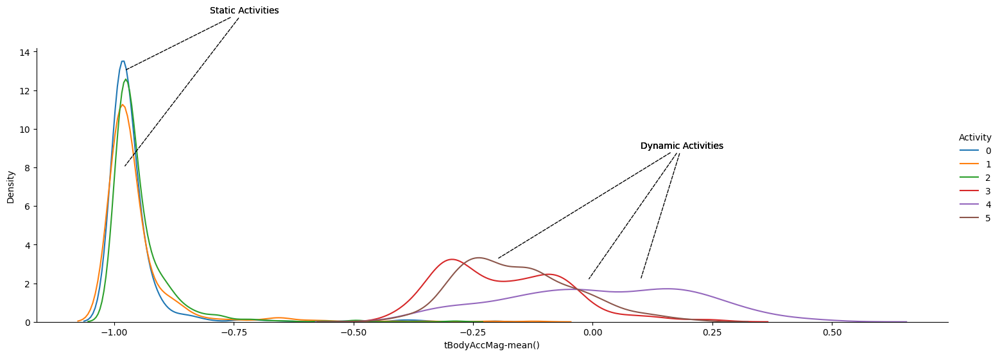

In [24]:
facetGrid = sns.FacetGrid(train,hue='Activity',height=5,aspect=3)
facetGrid.map(sns.distplot,'tBodyAccMag-mean()',hist = False).add_legend()

plt.annotate("Static Activities", xy = (-.98, 8), xytext = (-.8, 16), arrowprops={'arrowstyle': '-', 'ls': 'dashed'})
plt.annotate("Static Activities", xy = (-.98, 13), xytext = (-.8, 16), arrowprops={'arrowstyle': '-', 'ls': 'dashed'})
plt.annotate("Static Activities", xy = (-.98, 16), xytext = (-.8, 16), arrowprops={'arrowstyle': '-', 'ls': 'dashed'})

plt.annotate("Dynamic Activities", xy=(-0.2,3.25), xytext=(0.1, 9),arrowprops={'arrowstyle': '-', 'ls': 'dashed'})
plt.annotate("Dynamic Activities", xy=(0.1,2.18), xytext=(0.1, 9),arrowprops={'arrowstyle': '-', 'ls': 'dashed'})
plt.annotate("Dynamic Activities", xy=(-0.01,2.15), xytext=(0.1, 9),arrowprops={'arrowstyle': '-', 'ls': 'dashed'})

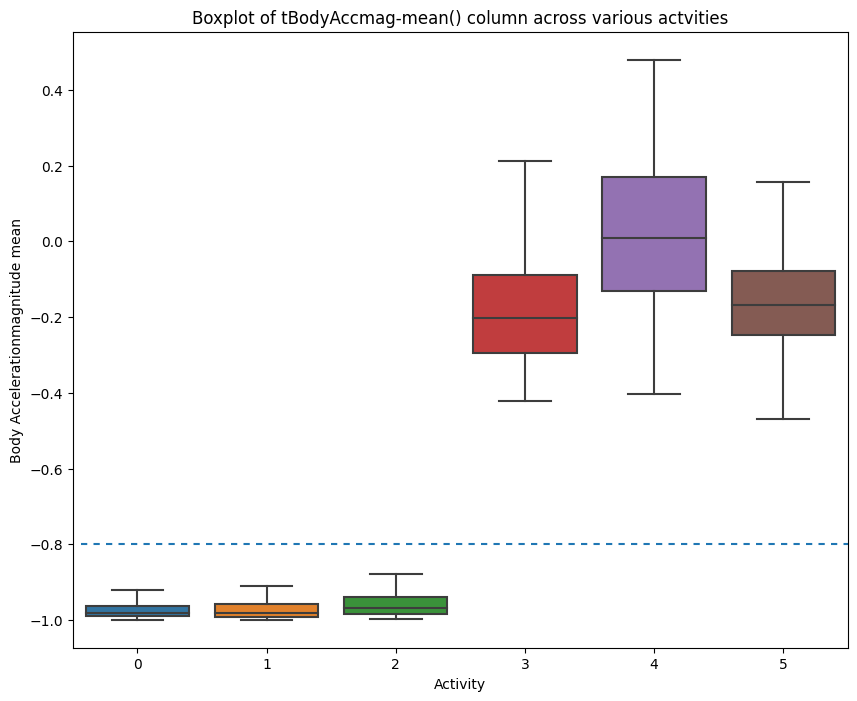

In [25]:
sns.boxplot(x='Activity',y='tBodyAccMag-mean()',data=train, showfliers=False)
plt.ylabel("Body Accelerationmagnitude mean")
plt.title('Boxplot of tBodyAccmag-mean() column across various actvities')
plt.axhline(y=-0.8,xmin=0.01,dashes=(3,3))
plt.show()

# Data splitting and Feature scealing

In [26]:
#Splitting the dataset
y = train['Activity']
X = train.drop(['Activity'], axis = 'columns')         #test data (removing target column)

In [27]:
y.head(10)

0    2
1    2
2    2
3    2
4    2
5    2
6    2
7    2
8    2
9    2
Name: Activity, dtype: int32

In [28]:
X.head(10)

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject
0,0.257178,-0.023285,-0.014654,-0.938404,-0.920091,-0.667683,-0.952501,-0.925249,-0.674302,-0.894088,...,-0.330370,-0.705974,0.006462,0.162920,-0.825886,0.271151,-0.720009,0.276801,-0.057978,2
1,0.286027,-0.013163,-0.119083,-0.975415,-0.967458,-0.944958,-0.986799,-0.968401,-0.945823,-0.894088,...,-0.121845,-0.594944,-0.083495,0.017500,-0.434375,0.920593,-0.698091,0.281343,-0.083898,2
2,0.275485,-0.026050,-0.118152,-0.993819,-0.969926,-0.962748,-0.994403,-0.970735,-0.963483,-0.939260,...,-0.190422,-0.640736,-0.034956,0.202302,0.064103,0.145068,-0.702771,0.280083,-0.079346,2
3,0.270298,-0.032614,-0.117520,-0.994743,-0.973268,-0.967091,-0.995274,-0.974471,-0.968897,-0.938610,...,-0.344418,-0.736124,-0.017067,0.154438,0.340134,0.296407,-0.698954,0.284114,-0.077108,2
4,0.274833,-0.027848,-0.129527,-0.993852,-0.967445,-0.978295,-0.994111,-0.965953,-0.977346,-0.938610,...,-0.534685,-0.846595,-0.002223,-0.040046,0.736715,-0.118545,-0.692245,0.290722,-0.073857,2
5,0.279220,-0.018620,-0.113902,-0.994455,-0.970417,-0.965316,-0.994585,-0.969481,-0.965897,-0.937856,...,-0.493517,-0.857565,-0.095681,0.048849,0.760684,-0.072216,-0.689816,0.294896,-0.068471,2
6,0.279746,-0.018271,-0.104000,-0.995819,-0.976354,-0.977725,-0.995996,-0.973665,-0.979253,-0.937856,...,-0.093855,-0.391286,-0.309083,-0.000857,0.728514,-0.333771,-0.690085,0.295282,-0.067065,2
7,0.274601,-0.025035,-0.116831,-0.995594,-0.982069,-0.985262,-0.995341,-0.981485,-0.984610,-0.941263,...,-0.338123,-0.672358,-0.025526,-0.214033,0.437640,-0.366674,-0.688785,0.295981,-0.067706,2
8,0.272529,-0.020954,-0.114472,-0.996784,-0.975906,-0.986597,-0.997029,-0.973735,-0.985556,-0.941263,...,-0.629599,-0.853248,0.144626,-0.035564,-0.181800,0.087320,-0.685390,0.299394,-0.065491,2
9,0.275746,-0.010372,-0.099776,-0.998373,-0.986933,-0.991022,-0.998663,-0.987140,-0.991084,-0.943761,...,-0.469743,-0.741435,0.157584,-0.033487,-0.350893,0.343146,-0.684110,0.300822,-0.064263,2


In [29]:
from sklearn.model_selection import train_test_split

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 20, stratify = y)

In [31]:
print(X_train.shape)
print(X_test.shape)

(2357, 562)
(590, 562)


In [32]:
train.columns

Index(['tBodyAcc-mean()-X', 'tBodyAcc-mean()-Y', 'tBodyAcc-mean()-Z',
       'tBodyAcc-std()-X', 'tBodyAcc-std()-Y', 'tBodyAcc-std()-Z',
       'tBodyAcc-mad()-X', 'tBodyAcc-mad()-Y', 'tBodyAcc-mad()-Z',
       'tBodyAcc-max()-X',
       ...
       'fBodyBodyGyroJerkMag-kurtosis()', 'angle(tBodyAccMean,gravity)',
       'angle(tBodyAccJerkMean),gravityMean)',
       'angle(tBodyGyroMean,gravityMean)',
       'angle(tBodyGyroJerkMean,gravityMean)', 'angle(X,gravityMean)',
       'angle(Y,gravityMean)', 'angle(Z,gravityMean)', 'subject', 'Activity'],
      dtype='object', length=563)

In [33]:
X_train.head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject
1812,0.299933,-0.039028,-0.177081,0.084275,0.010410,-0.360834,0.047123,-0.010230,-0.397086,0.478241,...,-0.012820,-0.451091,-0.125223,-0.283798,0.867595,0.300771,-0.817406,0.218267,-0.022360,13
1656,0.334961,-0.042251,-0.067205,0.006344,-0.133133,-0.016360,-0.035416,-0.150856,-0.083309,0.206450,...,-0.388207,-0.776247,-0.331867,-0.874489,0.842206,-0.542224,-0.716758,0.233515,0.163636,13
1074,0.274905,-0.014076,-0.110867,-0.997158,-0.975103,-0.972583,-0.997531,-0.972196,-0.968548,-0.943546,...,-0.499559,-0.830618,0.087936,0.586501,-0.908241,0.786481,-0.811879,-0.035605,0.017415,10
2370,0.244885,-0.038492,-0.106697,-0.003722,0.344080,-0.171064,-0.056077,0.328639,-0.155305,0.387682,...,-0.028233,-0.379148,0.082549,0.832754,-0.939574,0.318706,-0.492242,0.385739,0.214768,20
2546,0.121554,-0.005661,-0.076260,-0.062792,0.353278,-0.218462,-0.163828,0.435934,-0.241550,0.487900,...,-0.522346,-0.852946,0.735238,-0.338768,-0.187114,-0.235846,-0.543148,0.412702,-0.006420,20


In [34]:
scaler = MinMaxScaler().fit(X_train)

In [35]:
print(scaler)

MinMaxScaler()


In [36]:
scaler.data_min_

array([-0.59200434, -0.3628841 , -0.57618401, -0.99960647, -1.        ,
       -0.99895457, -0.99937488, -0.999914  , -0.99871835, -0.95070817,
       -0.58348718, -0.84611421, -0.50681593, -0.88078226, -0.64868043,
       -0.99896692, -0.99999875, -1.        , -0.99999188, -0.99933933,
       -0.99976162, -0.99817382, -1.        , -1.        , -1.        ,
       -1.        , -1.        , -0.98351035, -1.        , -0.82812972,
       -0.6040749 , -0.65881439, -0.89526116, -0.81774415, -0.77567997,
       -0.95376571, -0.94613548, -0.98763255, -0.97734528, -1.        ,
       -0.80691286, -1.        , -0.99108979, -0.99995586, -1.        ,
       -0.99958348, -0.99994917, -1.        , -0.99968795, -0.86322538,
       -0.9999867 , -0.99047329, -0.7567742 , -1.        , -0.99111803,
       -0.90127699, -0.99999481, -0.99999778, -1.        , -0.99994923,
       -1.        , -1.        , -1.        , -1.        , -1.        ,
       -0.99547916, -0.57605949, -0.99835285, -0.56666565, -0.99

In [37]:
scaler.data_max_

array([ 6.7188749e-01,  2.4610584e-01,  4.9411433e-01,  4.6529881e-01,
        9.6346226e-01,  4.8970267e-01,  4.3965684e-01,  8.8384780e-01,
        4.2795775e-01,  7.8643615e-01,  6.7471101e-01,  3.8451623e-01,
        8.5491058e-01,  7.0762981e-01,  8.5354261e-01,  4.8513814e-01,
        7.4740648e-02, -2.6025003e-01, -1.3052426e-02,  4.9403592e-01,
        5.1704665e-01,  7.9488852e-01,  1.0000000e+00,  7.2476862e-01,
        9.1609335e-01,  7.2185013e-01,  1.0000000e+00,  9.0782401e-01,
        8.7910665e-01,  6.9411027e-01,  7.8036187e-01,  8.9356554e-01,
        7.2413139e-01,  9.2732402e-01,  8.4013016e-01,  1.0000000e+00,
        6.4169415e-01,  9.7215594e-01,  9.6684694e-01,  9.8521018e-01,
        1.0000000e+00,  9.8283092e-01,  9.9558775e-01,  5.4211655e-01,
       -1.3004536e-01,  2.9107265e-02,  5.2533394e-01, -1.1473544e-01,
        5.7080083e-02,  9.9078875e-01,  1.0000000e+00,  1.0000000e+00,
        9.9614843e-01,  9.9051728e-01,  9.8654864e-01,  9.4715063e-01,
      

In [38]:
X_train.describe()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject
count,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,...,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000
mean,0.273435,-0.018276,-0.108055,-0.613311,-0.511391,-0.634599,-0.641044,-0.525191,-0.637480,-0.461160,...,-0.281244,-0.601546,0.005846,-0.001007,0.042218,-0.020507,-0.515017,0.075032,-0.048190,13.026729
std,0.061860,0.025942,0.043127,0.412963,0.489879,0.361244,0.385405,0.476154,0.356768,0.524947,...,0.317615,0.310166,0.332715,0.446353,0.633694,0.501623,0.510111,0.323293,0.241969,6.971605
min,-0.592004,-0.362884,-0.576184,-0.999606,-1.000000,-0.998955,-0.999375,-0.999914,-0.998718,-0.950708,...,-1.000000,-1.000000,-0.977973,-0.993402,-0.998898,-0.991096,-0.984195,-0.913704,-0.949228,2.000000
25%,0.262389,-0.024892,-0.120690,-0.991049,-0.973857,-0.975950,-0.992425,-0.974177,-0.975221,-0.934487,...,-0.520095,-0.834131,-0.129984,-0.283074,-0.512883,-0.431686,-0.830457,0.024340,-0.098614,9.000000
50%,0.277218,-0.016978,-0.108248,-0.932172,-0.789002,-0.827534,-0.937419,-0.795071,-0.820125,-0.852378,...,-0.315179,-0.687216,0.004975,0.000892,0.047267,-0.028790,-0.732201,0.181298,-0.010852,12.000000
75%,0.288383,-0.010372,-0.096704,-0.268764,-0.111459,-0.312579,-0.325212,-0.138074,-0.323658,-0.002905,...,-0.086279,-0.461018,0.141747,0.287623,0.623934,0.380586,-0.546097,0.258235,0.093169,20.000000
max,0.671887,0.246106,0.494114,0.465299,0.963462,0.489703,0.439657,0.883848,0.427958,0.786436,...,1.000000,1.000000,0.957756,0.982788,1.000000,0.983979,0.833180,1.000000,0.973113,24.000000


In [39]:
scaler.feature_range

(0, 1)

In [40]:
scaler.transform(X_train)

array([[0.70570708, 0.53179191, 0.37288932, ..., 0.59150782, 0.48215586,
        0.5       ],
       [0.73342113, 0.5265003 , 0.47554904, ..., 0.59947563, 0.57891104,
        0.5       ],
       [0.68590496, 0.57276475, 0.43475415, ..., 0.45884792, 0.50284674,
        0.36363636],
       ...,
       [0.68779118, 0.56712161, 0.43881524, ..., 0.42669063, 0.44011653,
        1.        ],
       [0.69914094, 0.57129223, 0.38906943, ..., 0.54483122, 0.46151536,
        0.09090909],
       [0.68844035, 0.55286804, 0.43550794, ..., 0.43114873, 0.99548028,
        0.36363636]])

In [41]:
scaler = MinMaxScaler().fit(X_test)

In [42]:
print(scaler)

MinMaxScaler()


In [43]:
scaler.data_min_

array([-0.27033343, -0.12193899, -0.42723163, -0.99949307, -0.99807443,
       -0.99861825, -0.99941708, -0.99751643, -0.99889873, -0.95235713,
       -0.57866438, -0.84550954, -0.38034161, -0.86642271, -0.25874585,
       -0.99785921, -0.99999814, -0.99998756, -0.99998449, -0.99909483,
       -0.9986836 , -0.99762577, -1.        , -0.9333724 , -1.        ,
       -0.80960332, -0.55328331, -0.94166371, -0.59857176, -0.7122775 ,
       -0.53660034, -0.57185596, -0.89987032, -0.65210198, -1.        ,
       -0.76503531, -0.6390668 , -0.94509667, -0.96419978, -0.9284766 ,
       -0.79008892, -0.99961699, -0.99081786, -0.99969684, -0.99966899,
       -0.99925992, -0.99976559, -0.99969159, -0.99932989, -0.85021152,
       -1.        , -0.99073801, -0.73896161, -0.95915039, -0.98859671,
       -0.83799278, -0.99999224, -0.99996876, -0.99999605, -0.99995129,
       -0.99992283, -0.99932283, -1.        , -1.        , -1.        ,
       -0.9919957 , -0.34143074, -0.99461913, -0.12791907, -0.98

In [44]:
scaler.data_max_

array([ 4.6013352e-01,  1.5867295e-01,  3.1399056e-01,  4.5004675e-01,
        1.0000000e+00,  3.7999219e-01,  4.1996098e-01,  1.0000000e+00,
        3.8454484e-01,  6.8902898e-01,  6.7471101e-01,  3.8451623e-01,
        8.5403016e-01,  6.9774878e-01,  8.5427720e-01,  4.0022192e-01,
        5.5092662e-02, -2.3380276e-01, -5.0293346e-02,  4.2552876e-01,
        6.5663705e-01,  4.4930528e-01,  8.2215131e-01,  6.0527025e-01,
        7.0747029e-01,  8.0683073e-01,  7.7620630e-01,  6.3356082e-01,
        8.3022082e-01,  7.1931356e-01,  6.8460872e-01,  8.9691709e-01,
        6.9352503e-01,  1.0000000e+00,  6.4438816e-01,  7.2394112e-01,
        5.1270929e-01,  9.7855342e-01,  8.1470785e-01,  9.9440525e-01,
        9.9394624e-01,  9.7928448e-01,  9.7738340e-01,  2.2838746e-01,
       -1.1946833e-02,  5.6096027e-01,  1.9708155e-01, -7.1650299e-02,
        5.2432207e-01,  9.8574672e-01,  9.3780602e-01,  9.7798541e-01,
        9.9589742e-01,  9.9094646e-01,  9.7634513e-01,  9.5147576e-01,
      

In [45]:
scaler.feature_range

(0, 1)

In [46]:
scaler.transform(X_test)

array([[0.74252839, 0.35874323, 0.44061715, ..., 0.22851703, 0.20923567,
        0.        ],
       [0.75008979, 0.34991754, 0.41172258, ..., 0.57424637, 0.51600183,
        0.45454545],
       [0.68929672, 0.56490277, 0.44041886, ..., 0.69537141, 0.6144815 ,
        0.81818182],
       ...,
       [0.75534295, 0.36865664, 0.39695699, ..., 0.54794624, 0.44289368,
        0.09090909],
       [0.78124546, 0.23252367, 0.14761626, ..., 0.5789529 , 0.4781125 ,
        0.36363636],
       [0.75376088, 0.45607951, 0.40388302, ..., 0.62017247, 0.6559401 ,
        0.        ]])

# Models Apply

## Decision tree

In [47]:
# create a decision tree model
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train) # train with training set; fit function is used to train the model
y_pred = dt.predict(X_test)
print(classification_report(y_test, y_pred))
print("Train Accuracy: ", accuracy_score(y_train, dt.predict(X_train)))
print("Test Accuracy: ", accuracy_score(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       108
           1       0.88      0.94      0.91        98
           2       0.94      0.89      0.91       107
           3       0.90      0.94      0.92        99
           4       0.90      0.93      0.91        84
           5       0.97      0.89      0.93        94

    accuracy                           0.93       590
   macro avg       0.93      0.93      0.93       590
weighted avg       0.93      0.93      0.93       590

Train Accuracy:  1.0
Test Accuracy:  0.9322033898305084


### Confusion Matrix function

In [48]:
# Confusion Matrix function; w

def plot_confusion_matrix(cm, classes=None, title='Confusion matrix'):
    """Plots a confusion matrix."""
    if classes is not None:
        sns.heatmap(cm, xticklabels=classes, yticklabels=classes, vmin=0., vmax=1., annot=True, annot_kws={'size':50})
    else:
        sns.heatmap(cm, vmin=0., vmax=1.)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

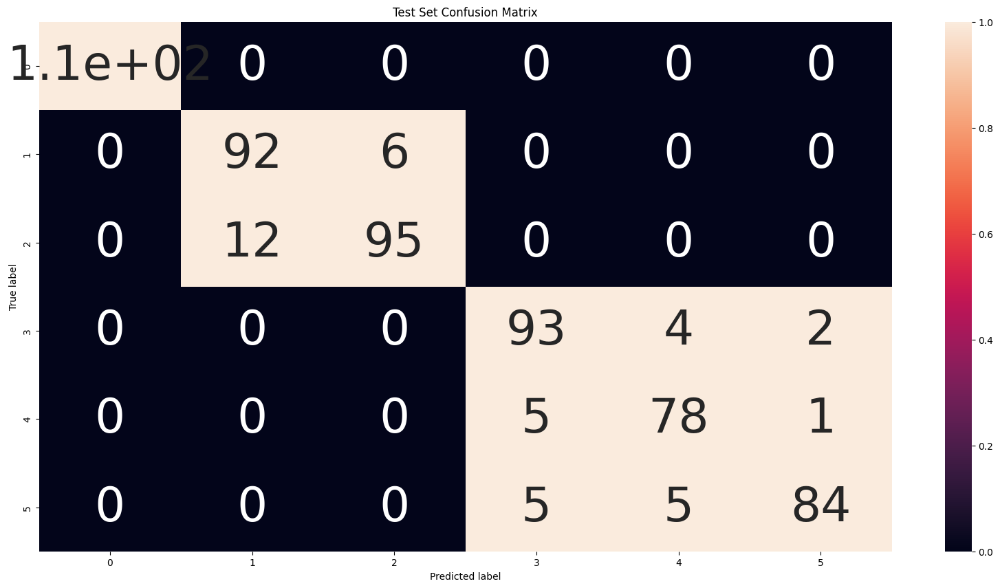

In [49]:
# Plotting Confusion Matrix
from sklearn import tree # used to visualize the decision tree model
cm = confusion_matrix(y_test, y_pred)
cm_norm = cm/cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize = (20,10))
plot_confusion_matrix(cm, classes=dt.classes_, title='Test Set Confusion Matrix')

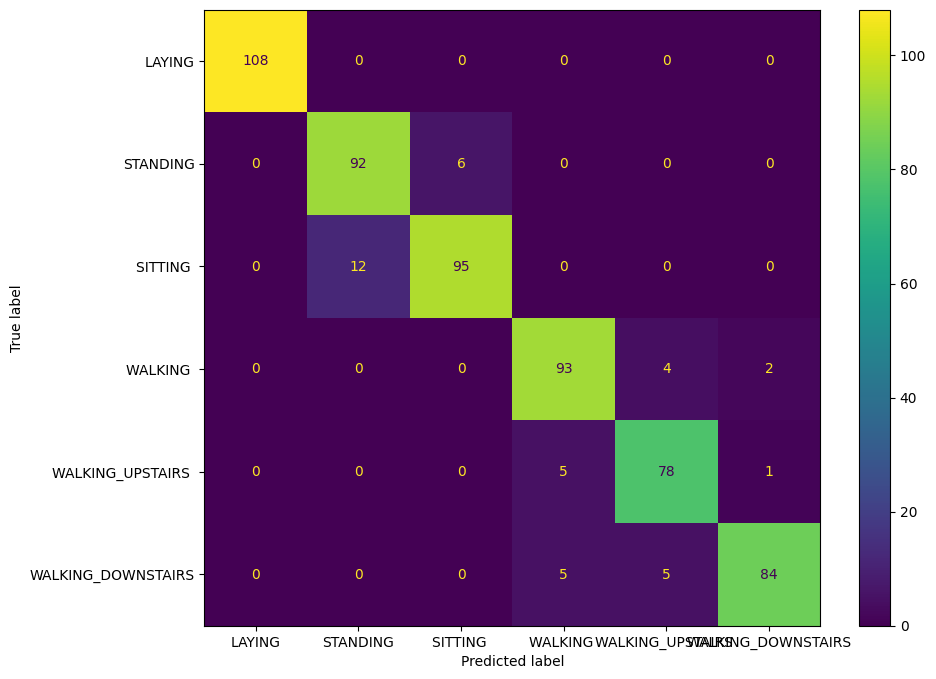

In [50]:

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[True, False])


from sklearn import metrics
import matplotlib.pyplot as plt

class_labels = ["LAYING", "STANDING", "SITTING ", "WALKING ", "WALKING_UPSTAIRS ", "WALKING_DOWNSTAIRS"]
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)

# cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cm , display_labels = [False, True])

cm_display.plot()
plt.show()

warnings.filterwarnings('ignore')

### GridSearchCv

In [51]:
from sklearn.model_selection import GridSearchCV

# generate a finer grid of hyperparameters
param_grid = {
    'criterion': ["gini","entropy"],
    'max_depth': [int(x) for x in np.linspace(10, 1000,50)],
}

print(param_grid)

{'criterion': ['gini', 'entropy'], 'max_depth': [10, 30, 50, 70, 90, 111, 131, 151, 171, 191, 212, 232, 252, 272, 292, 313, 333, 353, 373, 393, 414, 434, 454, 474, 494, 515, 535, 555, 575, 595, 616, 636, 656, 676, 696, 717, 737, 757, 777, 797, 818, 838, 858, 878, 898, 919, 939, 959, 979, 1000]}


In [52]:
from sklearn.model_selection import GridSearchCV
grid_search=GridSearchCV(dt,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(X_train,y_train)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


GridSearchCV(cv=10, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 30, 50, 70, 90, 111, 131, 151, 171,
                                       191, 212, 232, 252, 272, 292, 313, 333,
                                       353, 373, 393, 414, 434, 454, 474, 494,
                                       515, 535, 555, 575, 595, ...]},
             verbose=2)

In [53]:
grid_search.best_estimator_

DecisionTreeClassifier(max_depth=494)

In [54]:
best_grid=grid_search.best_estimator_

In [55]:
best_grid

DecisionTreeClassifier(max_depth=494)

In [56]:
y_pred=best_grid.predict(X_test)
y_p=best_grid.predict(X_train)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))
print("Train Accuracy: ", accuracy_score(y_train, y_p))
print("Test Accuracy: ", accuracy_score(y_test, y_pred))

[[108   0   0   0   0   0]
 [  0  93   5   0   0   0]
 [  0  12  95   0   0   0]
 [  0   0   0  93   2   4]
 [  0   0   0   4  79   1]
 [  0   0   0   6   4  84]]
Accuracy Score 0.9355932203389831
Classification report:               precision    recall  f1-score   support

           0       1.00      1.00      1.00       108
           1       0.89      0.95      0.92        98
           2       0.95      0.89      0.92       107
           3       0.90      0.94      0.92        99
           4       0.93      0.94      0.93        84
           5       0.94      0.89      0.92        94

    accuracy                           0.94       590
   macro avg       0.94      0.94      0.93       590
weighted avg       0.94      0.94      0.94       590

Train Accuracy:  1.0
Test Accuracy:  0.9355932203389831


In [57]:
# Confusion Matrix function; w

def plot_confusion_matrix(cm, classes=None, title='Confusion matrix'):
    """Plots a confusion matrix."""
    if classes is not None:
        sns.heatmap(cm, xticklabels=classes, yticklabels=classes, vmin=0., vmax=1., annot=True, annot_kws={'size':50})
    else:
        sns.heatmap(cm, vmin=0., vmax=1.)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

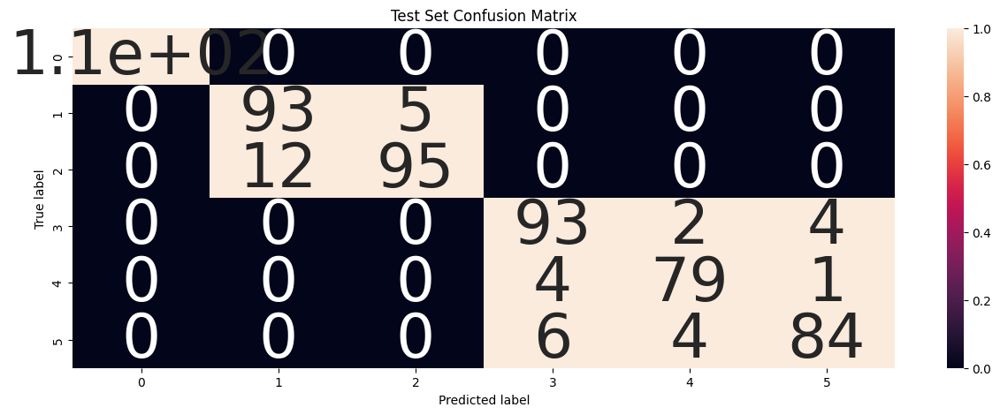

In [58]:
# Plotting Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
cm_norm = cm/cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize = (15,5))
plot_confusion_matrix(cm, classes=dt.classes_, title='Test Set Confusion Matrix')

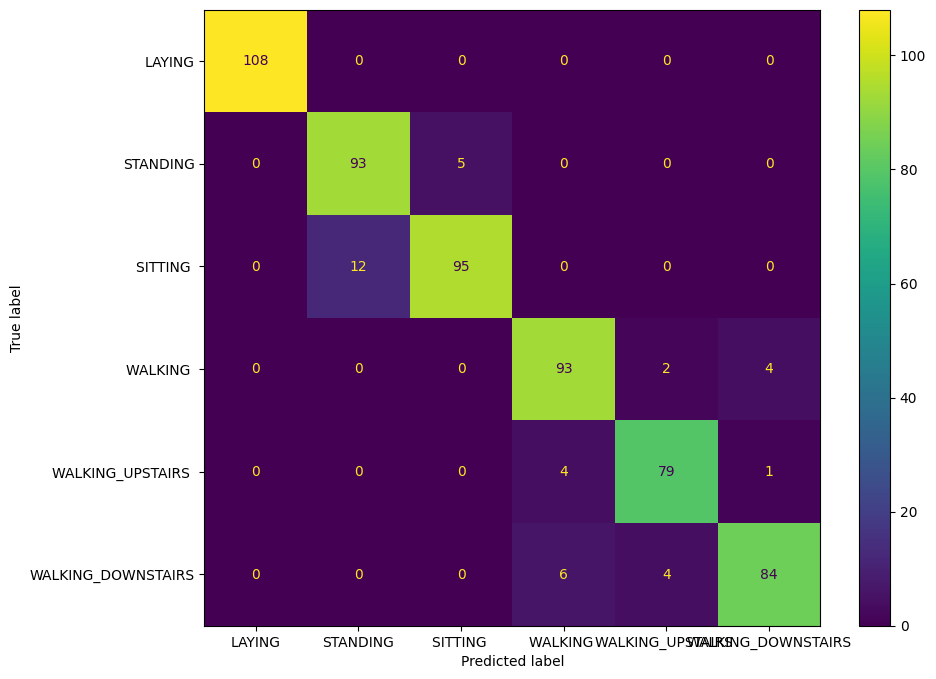

In [59]:
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[True, False])


from sklearn import metrics
import matplotlib.pyplot as plt

class_labels = ["LAYING", "STANDING", "SITTING ", "WALKING ", "WALKING_UPSTAIRS ", "WALKING_DOWNSTAIRS"]
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)

# cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cm , display_labels = [False, True])

cm_display.plot()
plt.show()

warnings.filterwarnings('ignore')

### RandomSearchCV

In [60]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(20, 1000,50)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240, 260, 280, 300, 320, 340, 360, 380, 400, 420, 440, 460, 480, 500, 520, 540, 560, 580, 600, 620, 640, 660, 680, 700, 720, 740, 760, 780, 800, 820, 840, 860, 880, 900, 920, 940, 960, 980, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [61]:

# Randomized search on hyper parameters
dt_randomcv=RandomizedSearchCV(estimator=dt,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
# Controls the verbosity: the higher, the more messages
# Number of jobs to run in parallel
### fit the randomized model
dt_randomcv.fit(X_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=DecisionTreeClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [20, 40, 60, 80, 100, 120,
                                                      140, 160, 180, 200, 220,
                                                      240, 260, 280, 300, 320,
                                                      340, 360, 380, 400, 420,
                                                      440, 460, 480, 500, 520,
                                                      540, 560, 580, 600, ...],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14]},
                   random_state=100, verbose=2)

In [62]:
dt_randomcv.best_params_
# Parameter setting that gave the best results

{'min_samples_split': 10,
 'min_samples_leaf': 4,
 'max_features': 'sqrt',
 'max_depth': 520,
 'criterion': 'entropy'}

In [63]:
dt_randomcv

RandomizedSearchCV(cv=3, estimator=DecisionTreeClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [20, 40, 60, 80, 100, 120,
                                                      140, 160, 180, 200, 220,
                                                      240, 260, 280, 300, 320,
                                                      340, 360, 380, 400, 420,
                                                      440, 460, 480, 500, 520,
                                                      540, 560, 580, 600, ...],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14]},
                   random_state=100, verbose=2)

In [64]:
dt_randomcv.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=520, max_features='sqrt',
                       min_samples_leaf=4, min_samples_split=10)

In [65]:
best_random_grid=dt_randomcv.best_estimator_
# storing the best hyperparameters

In [66]:
y_pred=best_grid.predict(X_test)
y_p=best_grid.predict(X_train)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))
print("Train Accuracy: ", accuracy_score(y_train, y_p))
print("Test Accuracy: ", accuracy_score(y_test, y_pred))


[[108   0   0   0   0   0]
 [  0  93   5   0   0   0]
 [  0  12  95   0   0   0]
 [  0   0   0  93   2   4]
 [  0   0   0   4  79   1]
 [  0   0   0   6   4  84]]
Accuracy Score 0.9355932203389831
Classification report:               precision    recall  f1-score   support

           0       1.00      1.00      1.00       108
           1       0.89      0.95      0.92        98
           2       0.95      0.89      0.92       107
           3       0.90      0.94      0.92        99
           4       0.93      0.94      0.93        84
           5       0.94      0.89      0.92        94

    accuracy                           0.94       590
   macro avg       0.94      0.94      0.93       590
weighted avg       0.94      0.94      0.94       590

Train Accuracy:  1.0
Test Accuracy:  0.9355932203389831


###Lime


In [67]:
import lime
import lime.lime_tabular

# Create the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train), mode="classification",feature_names= X_train.columns, categorical_features=[0])

# Choose a specific instance from the test set for explanation
explanation_instance = X_test.iloc[0]

# Get the explanation for the instance
explanation = explainer.explain_instance(explanation_instance, best_grid.predict_proba)

# Print the explanation for the predicted class
explanation.show_in_notebook()


In [68]:
explanation.as_list()

[('tBodyAccJerk-sma() <= -0.99', 0.21052484522922205),
 ('tGravityAcc-max()-Z > 0.17', 0.15032986150851071),
 ('angle(Y,gravityMean) <= 0.02', -0.14752250978010414),
 ('angle(X,gravityMean) > -0.55', -0.14637216255869923),
 ('tBodyAcc-mean()-X=0', -0.10572058582053863),
 ('tBodyGyroJerk-max()-X <= -0.99', 0.05494028288608474),
 ('fBodyAccMag-energy() <= -1.00', -0.050068163324486),
 ('tGravityAcc-max()-Y > 0.07', 0.044724343044943174),
 ('fBodyAcc-bandsEnergy()-9,16.2 <= -1.00', -0.04003983939843085),
 ('fBodyAccMag-kurtosis() > -0.56', -0.030247392688609154)]

## **Random Forest:**

In [69]:
# Create a Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Fit the classifier on the training data
rf_classifier.fit(X_train, y_train)

# Predict on the test data
y_pred = rf_classifier.predict(X_test)

In [70]:
# Evaluate the model
confusion_mat = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)


In [71]:
print("Confusion Matrix:")
print(confusion_mat)

print("\nClassification Report:")
print(classification_rep)


# Calculate and print the training accuracy
train_accuracy = accuracy_score(y_train, rf_classifier.predict(X_train))
print("Train Accuracy: {:.2f}%".format(train_accuracy * 100))

# Calculate and print the test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy: {:.2f}%".format(test_accuracy * 100))


Confusion Matrix:
[[108   0   0   0   0   0]
 [  0  95   3   0   0   0]
 [  0   3 104   0   0   0]
 [  0   0   0  99   0   0]
 [  0   0   0   1  82   1]
 [  0   0   0   1   0  93]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       108
           1       0.97      0.97      0.97        98
           2       0.97      0.97      0.97       107
           3       0.98      1.00      0.99        99
           4       1.00      0.98      0.99        84
           5       0.99      0.99      0.99        94

    accuracy                           0.98       590
   macro avg       0.99      0.98      0.98       590
weighted avg       0.98      0.98      0.98       590

Train Accuracy: 100.00%
Test Accuracy: 98.47%


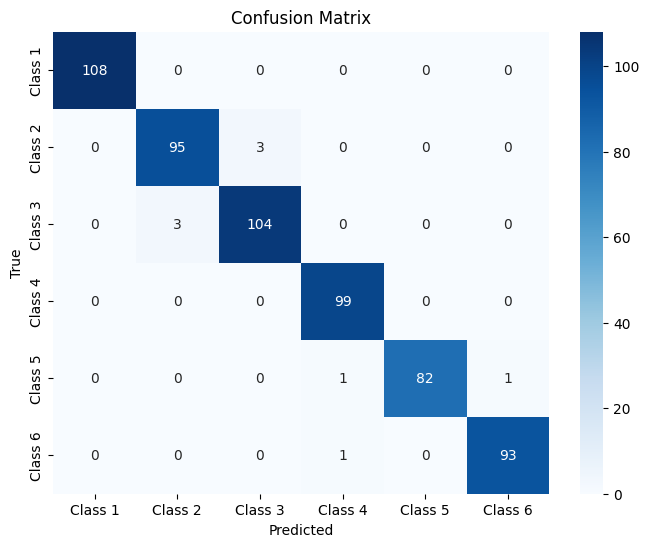

Classification Report:
               precision    recall  f1-score   support

     Class 1       1.00      1.00      1.00       108
     Class 2       0.97      0.97      0.97        98
     Class 3       0.97      0.97      0.97       107
     Class 4       0.98      1.00      0.99        99
     Class 5       1.00      0.98      0.99        84
     Class 6       0.99      0.99      0.99        94

    accuracy                           0.98       590
   macro avg       0.99      0.98      0.98       590
weighted avg       0.98      0.98      0.98       590



In [72]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Calculate confusion matrix
confusion_mat = confusion_matrix(y_test, y_pred)

# Define class labels
class_names = ["Class 1", "Class 2", "Class 3", "Class 4", "Class 5", "Class 6"]

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Generate and display classification report
class_report = classification_report(y_test, y_pred, target_names=class_names)
print("Classification Report:\n", class_report)


<Figure size 800x600 with 0 Axes>

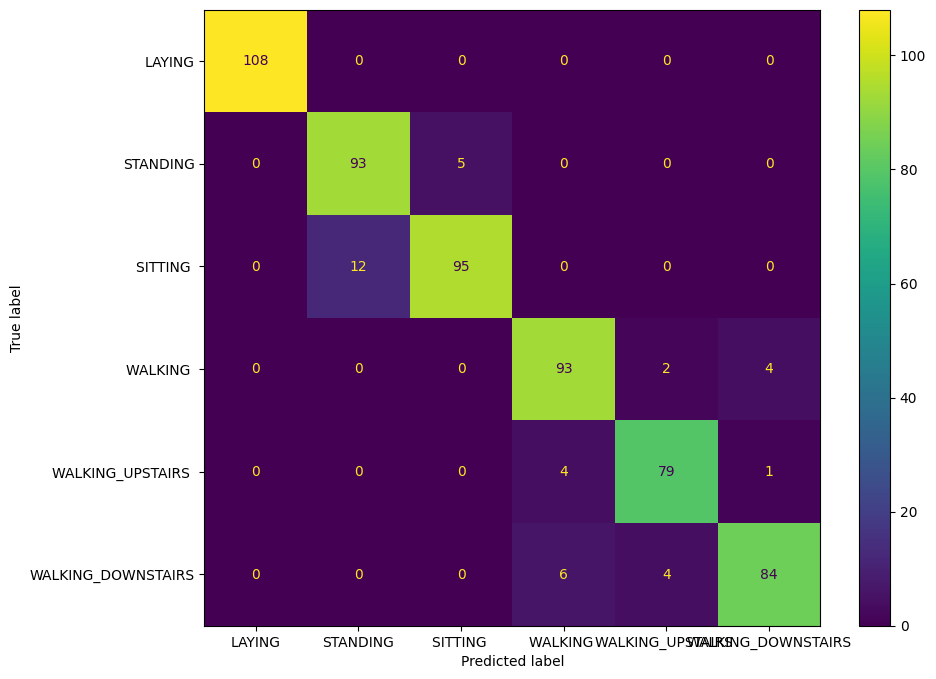

In [73]:
# Save confusion matrix as an image
plt.figure(figsize=(8, 6))
plt.class_labels = ["LAYING", "STANDING", "SITTING ", "WALKING ", "WALKING_UPSTAIRS ", "WALKING_DOWNSTAIRS"]


cm_display.plot()
plt.show()


In [74]:


# Define the hyperparameter grid
param_dist = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf_classifier,
    param_distributions=param_dist,
    n_iter=10,  # Adjust the number of iterations as needed
    cv=3,       # Number of cross-validation folds
    n_jobs=-1,  # Utilize all available CPU cores
    verbose=2
)



# Perform hyperparameter tuning
random_search.fit(X_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=42),
                   n_jobs=-1,
                   param_distributions={'max_depth': [None, 10, 20, 30],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300]},
                   verbose=2)

In [75]:
# Get the best parameters
best_params = random_search.best_params_
print("Best Parameters:", best_params)

# Use the best model for prediction
best_rf_classifier = random_search.best_estimator_
y_pred_best = best_rf_classifier.predict(X_test)

# Evaluate the best model
accuracy_best = accuracy_score(y_test, y_pred_best)
print("Best Model Accuracy: {:.3f}%".format(accuracy_best*100))

Best Parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_depth': None}
Best Model Accuracy: 99.153%


In [76]:
# Set a specific value for the number of estimators (trees) in the Random Forest
n_estimators = 100  # You can adjust this value

# Create a Random Forest classifier with the specified number of estimators
rf_classifier_tuned = RandomForestClassifier(
    n_estimators=n_estimators,
    random_state=42
)

# Fit the classifier on the training data
rf_classifier_tuned.fit(X_train, y_train)

# Predict on the test data
y_pred_tuned = rf_classifier_tuned.predict(X_test)

# Calculate and print the test accuracy for the tuned model
test_accuracy_tuned = accuracy_score(y_test, y_pred_tuned)
print("Tuned Model Best Accuracy: {:.3f}%".format(test_accuracy_tuned*100))

Tuned Model Best Accuracy: 98.475%


In [77]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score

# Create a Random Forest classifier with default values
rf_classifier = RandomForestClassifier(random_state=42)

# Define an empty hyperparameter grid (no values will be changed)
param_dist = {}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf_classifier,
    param_distributions=param_dist,
    n_iter=1,  # You can set this to 1 since no hyperparameters will be changed
    cv=3,       # Number of cross-validation folds
    n_jobs=-1,  # Utilize all available CPU cores
    random_state=42,  # Set a random seed for reproducibility
    verbose=2
)

# Perform hyperparameter tuning (no values will be changed)
random_search.fit(X_train, y_train)

# Use the best model for prediction
best_rf_classifier = random_search.best_estimator_
y_pred_best = best_rf_classifier.predict(X_test)

# Evaluate the best model
accuracy_best = accuracy_score(y_test, y_pred_best)
print("Best Model Accuracy (with default hyperparameters):{:.3f}%".format(accuracy_best*100))


Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best Model Accuracy (with default hyperparameters):98.475%


In [78]:
import lime
import lime.lime_tabular

# Create the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train), mode="classification",feature_names= X_train.columns, categorical_features=[0])

# Choose a specific instance from the test set for explanation
explanation_instance = X_test.iloc[0]

# Get the explanation for the instance
explanation = explainer.explain_instance(explanation_instance, best_grid.predict_proba)

# Print the explanation for the predicted class
explanation.show_in_notebook()

In [79]:
explanation.as_list()

[('tBodyAccJerk-sma() <= -0.99', 0.19404035912886902),
 ('tGravityAcc-max()-Z > 0.17', 0.15787869538582974),
 ('angle(X,gravityMean) > -0.55', -0.14545205660878277),
 ('angle(Y,gravityMean) <= 0.02', -0.1394208984195593),
 ('tBodyAcc-mean()-X=0', -0.13431351676994943),
 ('tGravityAcc-max()-Y > 0.07', 0.0495822479959201),
 ('fBodyAccMag-energy() <= -1.00', -0.04520340413402345),
 ('fBodyGyro-std()-X <= -0.99', 0.043408561696524725),
 ('tBodyGyro-iqr()-X <= -0.99', 0.04231955926373182),
 ('fBodyAccJerk-bandsEnergy()-17,32.2 <= -1.00', -0.029743050769963867)]

## KNN (K-Nearest Neighbors Algorithm)

In [80]:
print('Training data size : ', X_train.shape)
print('Test data size : ', X_test.shape)

Training data size :  (2357, 562)
Test data size :  (590, 562)


In [81]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

knn = KNeighborsClassifier(n_neighbors=7)

knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.9559322033898305


## Hyperparameter Tuning KNN

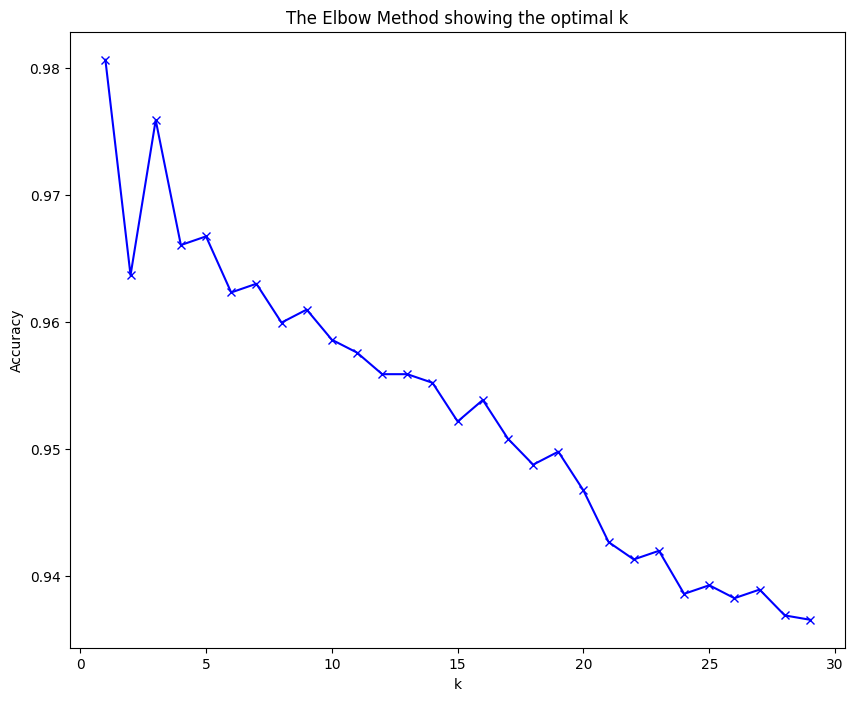

In [82]:
from sklearn.model_selection import cross_val_score

k_range = range(1, 30)
cv_scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, pd.concat([X_train,X_test], axis=0), pd.concat([y_train,y_test], axis=0), cv=10, scoring='accuracy')
    cv_scores.append(scores.mean())

plt.plot(k_range, cv_scores, 'bx-')
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [83]:
n_neighbors = list(range(1,30))

#Convert to dictionary
hyperparameters = dict(n_neighbors=n_neighbors)
#Create new KNN object
knn_2 = KNeighborsClassifier()
#Use GridSearch
clf = GridSearchCV(knn_2, hyperparameters, cv=10)
#Fit the model
best_model = clf.fit(X_train, y_train)
#Print The value of best Hyperparameters
b = best_model.best_estimator_.get_params()['n_neighbors']
print('Best n_neighbors:', b)

Best n_neighbors: 1


In [84]:
knn = KNeighborsClassifier(n_neighbors= b)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Best Model Accuracy (KNN): ", accuracy)

Best Model Accuracy (KNN):  0.9779661016949153


### Confusion Matrix function KNN

In [85]:
result = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test, y_pred)
print("\nClassification Report:\n",)
print (result1)

Confusion Matrix:
[[108   0   0   0   0   0]
 [  0  93   5   0   0   0]
 [  0   8  99   0   0   0]
 [  0   0   0  99   0   0]
 [  0   0   0   0  84   0]
 [  0   0   0   0   0  94]]

Classification Report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       108
           1       0.92      0.95      0.93        98
           2       0.95      0.93      0.94       107
           3       1.00      1.00      1.00        99
           4       1.00      1.00      1.00        84
           5       1.00      1.00      1.00        94

    accuracy                           0.98       590
   macro avg       0.98      0.98      0.98       590
weighted avg       0.98      0.98      0.98       590



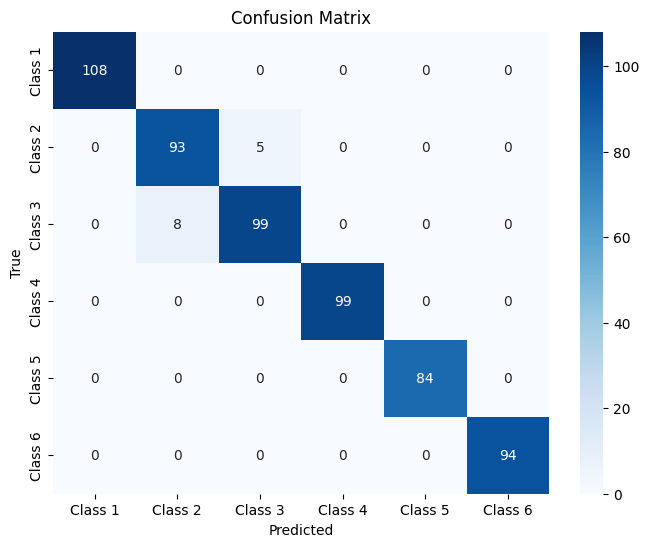

In [86]:
# Calculate confusion matrix
confusion_mat = confusion_matrix(y_test, y_pred)

# Define class labels
class_names = ["Class 1", "Class 2", "Class 3", "Class 4", "Class 5", "Class 6"]

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [87]:
# Create the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train), mode="classification",feature_names= X_train.columns, categorical_features=[0])

# Choose a specific instance from the test set for explanation
explanation_instance = X_test.iloc[0]

# Get the explanation for the instance
explanation = explainer.explain_instance(explanation_instance, best_grid.predict_proba)

# Print the explanation for the predicted class
explanation.show_in_notebook()


In [88]:
explanation.as_list()

[('tBodyAccJerk-sma() <= -0.99', 0.1992227663474454),
 ('angle(X,gravityMean) > -0.55', -0.14621563014130776),
 ('tGravityAcc-max()-Z > 0.17', 0.14321576074957598),
 ('angle(Y,gravityMean) <= 0.02', -0.13979238560094998),
 ('tBodyAcc-mean()-X=0', -0.10128233354004379),
 ('tGravityAcc-max()-Y > 0.07', 0.06542757933301331),
 ('fBodyAccMag-energy() <= -1.00', -0.04411929608797852),
 ('fBodyGyro-entropy()-Y <= -0.59', -0.04152611640474532),
 ('fBodyGyro-bandsEnergy()-25,48.2 <= -1.00', -0.03564494897487213),
 ('tGravityAccMag-mean() <= -0.98', 0.03527659655571109)]

## Initialize and train the logistic regression model


In [89]:
# Initialize and train the logistic regression model
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)


# Predict on the test data
y_pred = model.predict(X_test)

In [90]:
# Evaluate the model
confusion_mat = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

In [91]:
print("Confusion Matrix:")
print(confusion_mat)

Confusion Matrix:
[[108   0   0   0   0   0]
 [  0  97   1   0   0   0]
 [  0   4 103   0   0   0]
 [  0   0   0  99   0   0]
 [  0   0   0   0  84   0]
 [  0   0   0   0   0  94]]


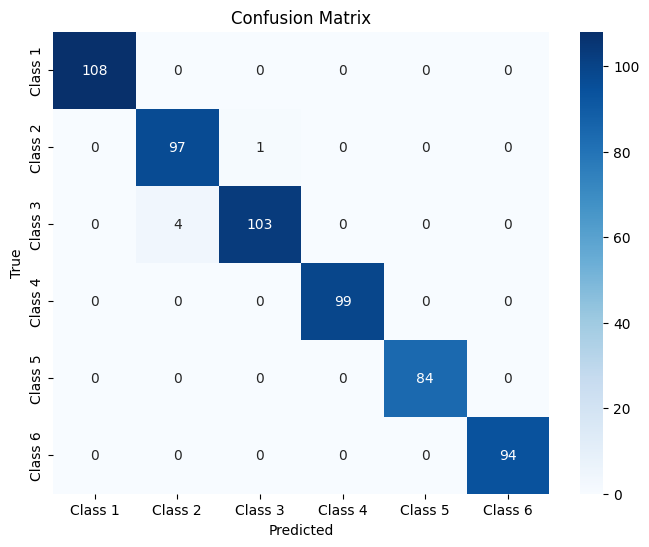

Classification Report:
               precision    recall  f1-score   support

     Class 1       1.00      1.00      1.00       108
     Class 2       0.96      0.99      0.97        98
     Class 3       0.99      0.96      0.98       107
     Class 4       1.00      1.00      1.00        99
     Class 5       1.00      1.00      1.00        84
     Class 6       1.00      1.00      1.00        94

    accuracy                           0.99       590
   macro avg       0.99      0.99      0.99       590
weighted avg       0.99      0.99      0.99       590



In [92]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Calculate confusion matrix
confusion_mat = confusion_matrix(y_test, y_pred)

# Define class labels
class_names = ["Class 1", "Class 2", "Class 3", "Class 4", "Class 5", "Class 6"]

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Generate and display classification report
class_report = classification_report(y_test, y_pred, target_names=class_names)
print("Classification Report:\n", class_report)


In [93]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9915254237288136


In [94]:
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'newton-cg', 'lbfgs', 'saga']
}

grid_search = GridSearchCV(LogisticRegression(), param_grid, cv=5)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_


In [97]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Assuming you have X_train, y_train, X_test, and y_test defined appropriately

# Create an instance of LogisticRegression with the best hyperparameters
best_lr_model = LogisticRegression()  # You should specify your best hyperparameters here if needed

# Fit the model to the training data
best_lr_model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = best_lr_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("Confusion Matrix:\n", confusion)
print("Classification Report:\n", report)


Accuracy: 0.9915254237288136
Confusion Matrix:
 [[108   0   0   0   0   0]
 [  0  97   1   0   0   0]
 [  0   4 103   0   0   0]
 [  0   0   0  99   0   0]
 [  0   0   0   0  84   0]
 [  0   0   0   0   0  94]]
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       108
           1       0.96      0.99      0.97        98
           2       0.99      0.96      0.98       107
           3       1.00      1.00      1.00        99
           4       1.00      1.00      1.00        84
           5       1.00      1.00      1.00        94

    accuracy                           0.99       590
   macro avg       0.99      0.99      0.99       590
weighted avg       0.99      0.99      0.99       590



In [98]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
kernel = 1.0 * RBF(length_scale=1.0)
gpc = GaussianProcessClassifier(kernel=kernel, random_state=42)
gpc.fit(X_train, y_train)
y_pred = gpc.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.4327683615819209


In [99]:
# Create the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train), mode="classification",feature_names= X_train.columns, categorical_features=[0])

# Choose a specific instance from the test set for explanation
explanation_instance = X_test.iloc[0]

# Get the explanation for the instance
explanation = explainer.explain_instance(explanation_instance, best_grid.predict_proba)

# Print the explanation for the predicted class
explanation.show_in_notebook()


In [100]:
explanation.as_list()

[('-0.93 < tBodyAccJerk-sma() <= -0.31', -0.1929163728083885),
 ('angle(X,gravityMean) <= -0.83', 0.07758747152178129),
 ('-0.99 < fBodyAccMag-energy() <= -0.73', -0.05191173460188677),
 ('fBodyAccJerk-bandsEnergy()-41,48 > -0.86', -0.035496549793999195),
 ('-1.00 < fBodyAcc-bandsEnergy()-25,32.2 <= -0.95', -0.03516047590196633),
 ('-1.00 < fBodyAcc-bandsEnergy()-49,64 <= -0.94', -0.03331929059764673),
 ('tBodyGyroJerk-mad()-X > -0.49', 0.029260908942179396),
 ('-0.96 < tGravityAccMag-min() <= -0.69', -0.028909885416519305),
 ('-0.78 < tBodyGyro-max()-X <= -0.45', 0.025664659909738454),
 ('tBodyAcc-mean()-X=0', 0.0009352215033031023)]

## **XG BOOST**

In [101]:


# Initialize the XGBoost classifier
xgb_classifier = XGBClassifier(random_state=42)

# Fit the classifier on the training data
xgb_classifier.fit(X_train, y_train)

# Predict on the test data
y_pred_xgb = xgb_classifier.predict(X_test)

# Calculate and print the accuracy
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print("XGBoost Model Accuracy: {:.2f}%".format(accuracy_xgb * 100))

# Generate and print the classification report
class_report_xgb = classification_report(y_test, y_pred_xgb)
print("Classification Report:\n", class_report_xgb)

# Generate and print the confusion matrix
confusion_mat_xgb = confusion_matrix(y_test, y_pred_xgb)
print("Confusion Matrix:")
print(confusion_mat_xgb)




XGBoost Model Accuracy: 98.64%
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       170
           1       0.99      0.99      0.99       152
           2       0.99      0.99      0.99       137
           3       0.97      0.99      0.98       154
           4       0.99      0.96      0.98       123
           5       0.98      0.99      0.98       149

    accuracy                           0.99       885
   macro avg       0.99      0.99      0.99       885
weighted avg       0.99      0.99      0.99       885

Confusion Matrix:
[[170   0   0   0   0   0]
 [  0 150   2   0   0   0]
 [  0   2 135   0   0   0]
 [  0   0   0 153   0   1]
 [  0   0   0   3 118   2]
 [  0   0   0   1   1 147]]


In [102]:
# Define the hyperparameter grid for hyperparameter tuning
param_dist = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9],
}

# Initialize RandomizedSearchCV for hyperparameter tuning
random_search_xgb = RandomizedSearchCV(
    estimator=xgb_classifier,
    param_distributions=param_dist,
    n_iter=10,
    cv=3,
    n_jobs=-1,
    random_state=42,
    verbose=2
)

# Perform hyperparameter tuning
random_search_xgb.fit(X_train, y_train)

# Get the best hyperparameters
best_params_xgb = random_search_xgb.best_params_
print("Best Parameters:", best_params_xgb)

# Use the best model for prediction
best_xgb_classifier = random_search_xgb.best_estimator_
y_pred_best_xgb = best_xgb_classifier.predict(X_test)

# Evaluate the best model
accuracy_best_xgb = accuracy_score(y_test, y_pred_best_xgb)
print("Best Model Accuracy (XGBoost): {:.2f}%".format(accuracy_best_xgb * 100))

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Parameters: {'subsample': 0.7, 'n_estimators': 300, 'max_depth': 4, 'learning_rate': 0.2, 'colsample_bytree': 0.8}
Best Model Accuracy (XGBoost): 99.32%


In [103]:
# Initialize the XGBoost classifier with default hyperparameters
xgb_classifier = XGBClassifier(random_state=42)

# Fit the classifier on the training data
xgb_classifier.fit(X_train, y_train)

# Predict on the test data
y_pred_xgb = xgb_classifier.predict(X_test)

# Calculate and print the accuracy
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print("XGBoost Model Accuracy (Default Hyperparameters): {:.2f}%".format(accuracy_xgb * 100))


XGBoost Model Accuracy (Default Hyperparameters): 98.64%


In [104]:
# Create the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train), mode="classification",feature_names= X_train.columns, categorical_features=[0])

# Choose a specific instance from the test set for explanation
explanation_instance = X_test.iloc[0]

# Get the explanation for the instance
explanation = explainer.explain_instance(explanation_instance, best_grid.predict_proba)

# Print the explanation for the predicted class
explanation.show_in_notebook()

In [105]:
explanation.as_list()

[('-0.93 < tBodyAccJerk-sma() <= -0.31', -0.1917516105062613),
 ('0.05 < tGravityAcc-max()-Z <= 0.17', -0.05882669773430683),
 ('-0.99 < fBodyAccMag-energy() <= -0.73', -0.05624357130689064),
 ('-0.15 < tGravityAcc-max()-Y <= 0.07', 0.054516086404914364),
 ('angle(X,gravityMean) <= -0.83', 0.04567800297437998),
 ('0.02 < tBodyGyroJerk-arCoeff()-X,3 <= 0.16', -0.039541024393794304),
 ('-0.62 < tBodyGyro-max()-Z <= -0.26', 0.037936991514835955),
 ('-0.05 < fBodyGyro-entropy()-X <= 0.52', -0.03757740631885595),
 ('-0.85 < fBodyAccMag-std() <= -0.39', 0.03366720531262734),
 ('tBodyAcc-mean()-X=0', -0.012121587441756065)]

# AdaBoost

In [106]:
# Load libraries
from sklearn.ensemble import AdaBoostClassifier

# Create adaboost classifer object
abc = AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=42)

# Train Adaboost Classifer
model = abc.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = model.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Classification Report:\n", classification_report(y_test, y_pred))

print("\nTrain Accuracy: ", accuracy_score(y_train, abc.predict(X_train)))
print("Test Accuracy: ", accuracy_score(y_test, y_pred))


Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       170
           1       0.00      0.00      0.00       152
           2       0.47      1.00      0.64       137
           3       0.36      1.00      0.53       154
           4       0.00      0.00      0.00       123
           5       0.00      0.00      0.00       149

    accuracy                           0.52       885
   macro avg       0.31      0.50      0.36       885
weighted avg       0.33      0.52      0.38       885


Train Accuracy:  0.5354025218234724
Test Accuracy:  0.5209039548022599


In [107]:
# Import Support Vector Classifier
from sklearn.svm import SVC

svc=SVC(probability=True, kernel='linear')

# Create adaboost classifer object
abc =AdaBoostClassifier(n_estimators=50, base_estimator=svc,learning_rate=1,  random_state=42)

# Train Adaboost Classifer
model = abc.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = model.predict(X_test)


# Model Accuracy, how often is the classifier correct?
print("Classification Report:\n", classification_report(y_test, y_pred))
print("\nTrain Accuracy: ", metrics.accuracy_score(y_train, abc.predict(X_train)))
print("Test Accuracy:",metrics.accuracy_score(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       170
           1       1.00      0.10      0.18       152
           2       0.50      1.00      0.67       137
           3       0.89      0.97      0.93       154
           4       0.83      0.82      0.83       123
           5       0.96      0.89      0.92       149

    accuracy                           0.80       885
   macro avg       0.86      0.80      0.75       885
weighted avg       0.87      0.80      0.76       885


Train Accuracy:  0.8074684772065955
Test Accuracy: 0.7954802259887006


Confusion Matrix:
 [[170   0   0   0   0   0]
 [  0  15 137   0   0   0]
 [  0   0 137   0   0   0]
 [  0   0   0 149   5   0]
 [  0   0   0  17 101   5]
 [  0   0   0   2  15 132]]





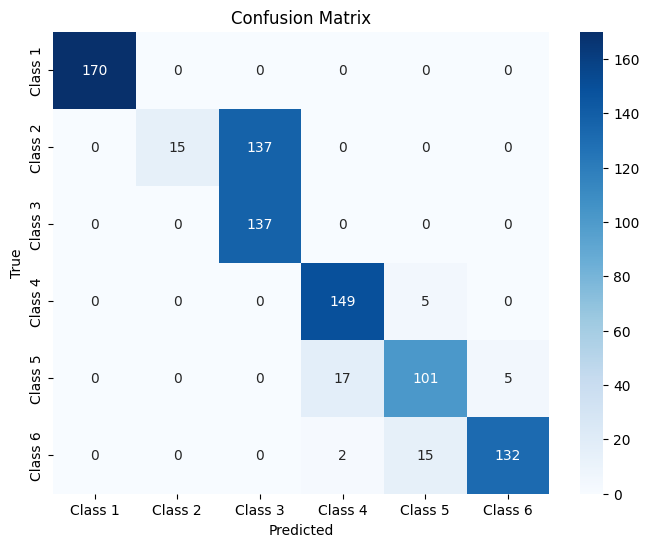

In [108]:
#Confusion Matrix

result = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", result)
print("\n\n")
# Calculate confusion matrix
confusion_mat = confusion_matrix(y_test, y_pred)

# Define class labels
class_names = ["Class 1", "Class 2", "Class 3", "Class 4", "Class 5", "Class 6"]

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [109]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

# Define the base estimator (e.g., Support Vector Machine)
base_estimator = SVC(probability=True, kernel='linear')

# Create the AdaBoostClassifier
adaboost_classifier = AdaBoostClassifier(base_estimator=base_estimator)

# Define the hyperparameters and their values to search over (reduced search space)
param_grid = {
    'n_estimators': [50, 200, 500],
    'learning_rate': [0.01, 0.1, 1.0],
}

# Create a GridSearchCV object with a smaller grid
grid_search_ada = GridSearchCV(adaboost_classifier, param_grid=param_grid, cv=3, verbose=2, n_jobs=-1)

# Fit the grid search to your data
grid_search_ada.fit(X_train, y_train)

# Get the best hyperparameters and the best estimator
best_params = grid_search_ada.best_params_
best_estimator = grid_search_ada.best_estimator_

# Print the best hyperparameters
print("Best Hyperparameters: ", best_params)
print("Best Estimator: ", best_estimator)

# Use the best model for prediction
best_classifier = grid_search_ada.best_estimator_
y_pred_best = best_classifier.predict(X_test)

# Evaluate the best model
accuracy_best = accuracy_score(y_test, y_pred_best)
print("Best Model Accuracy (Adaboost): {:.2f}%".format(accuracy_best * 100))


Fitting 3 folds for each of 9 candidates, totalling 27 fits
Best Hyperparameters:  {'learning_rate': 0.01, 'n_estimators': 200}
Best Estimator:  AdaBoostClassifier(base_estimator=SVC(kernel='linear', probability=True),
                   learning_rate=0.01, n_estimators=200)
Best Model Accuracy (Adaboost): 95.03%


In [110]:
pip install optuna

Note: you may need to restart the kernel to use updated packages.


In [111]:
#Optuna

import optuna
from optuna.samplers import TPESampler

def objective(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 500)
    learning_rate = trial.suggest_float("learning_rate", 0.001, 1.0, log=True)
    abc = AdaBoostClassifier(n_estimators=n_estimators, learning_rate=learning_rate, random_state=1)
    abc.fit(X_train, y_train)
    y_pred = abc.predict(X_test)
    return accuracy_score(y_test, y_pred)

In [112]:
sampler = TPESampler(seed=1)
study = optuna.create_study(direction="maximize", sampler=sampler)
study.optimize(objective, n_trials=30)

print("\n \n Number of finished trials: ", len(study.trials))
print("\nBest trial:")
trial = study.best_trial
print("  Accuracy: ", trial.value)
print("\n  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))


[I 2023-11-05 05:30:44,202] A new study created in memory with name: no-name-7d9ea0ec-465c-4b11-9452-38253c286d01
[I 2023-11-05 05:31:57,590] Trial 0 finished with value: 0.6372881355932203 and parameters: {'n_estimators': 238, 'learning_rate': 0.14486833887239342}. Best is trial 0 with value: 0.6372881355932203.
[I 2023-11-05 05:32:13,039] Trial 1 finished with value: 0.5209039548022599 and parameters: {'n_estimators': 50, 'learning_rate': 0.008072307884499755}. Best is trial 0 with value: 0.6372881355932203.
[I 2023-11-05 05:32:48,926] Trial 2 finished with value: 0.5209039548022599 and parameters: {'n_estimators': 116, 'learning_rate': 0.0018924123965722254}. Best is trial 0 with value: 0.6372881355932203.
[I 2023-11-05 05:33:30,453] Trial 3 finished with value: 0.5209039548022599 and parameters: {'n_estimators': 134, 'learning_rate': 0.010881335003635882}. Best is trial 0 with value: 0.6372881355932203.
[I 2023-11-05 05:34:40,439] Trial 4 finished with value: 0.5209039548022599 and


 
 Number of finished trials:  30

Best trial:
  Accuracy:  0.7638418079096045

  Params: 
    n_estimators: 352
    learning_rate: 0.25024337364637866


In [117]:
abc = AdaBoostClassifier(n_estimators=trial.params["n_estimators"], learning_rate=trial.params["learning_rate"], random_state=1)


abc.fit(X_train, y_train)

y_pred = abc.predict(X_test)
print("Accuracy: ", accuracy_score(y_test, y_pred))

print("\nClassification Report:\n", classification_report(y_test, y_pred))

Accuracy:  0.7638418079096045

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       170
           1       0.87      0.22      0.36       152
           2       0.53      0.96      0.68       137
           3       0.91      0.95      0.93       154
           4       0.96      0.44      0.60       123
           5       0.67      0.94      0.78       149

    accuracy                           0.76       885
   macro avg       0.82      0.75      0.73       885
weighted avg       0.83      0.76      0.74       885



Confusion Matrix:
 [[170   0   0   0   0   0]
 [  0  34 118   0   0   0]
 [  0   5 132   0   0   0]
 [  0   0   0 146   0   8]
 [  0   0   0   7  54  62]
 [  0   0   0   7   2 140]]





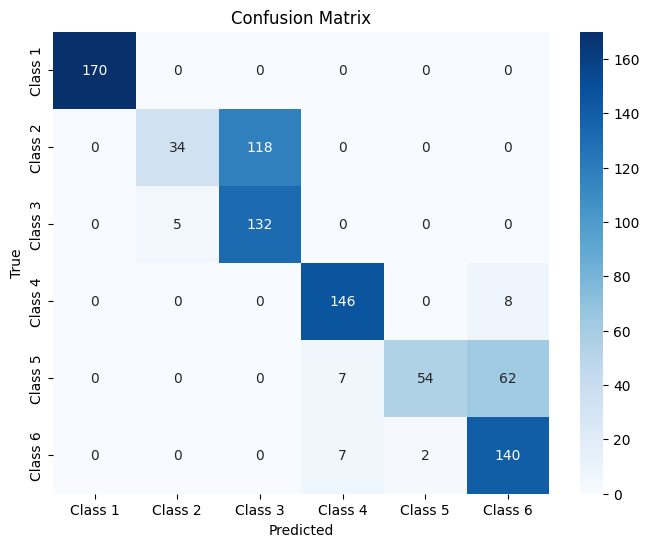

In [118]:
#Confusion Matrix

result = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", result)
print("\n\n")
# Calculate confusion matrix
confusion_mat = confusion_matrix(y_test, y_pred)

# Define class labels
class_names = ["Class 1", "Class 2", "Class 3", "Class 4", "Class 5", "Class 6"]

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [119]:
# Create the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train), mode="classification",feature_names= X_train.columns, categorical_features=[0])

# Choose a specific instance from the test set for explanation
explanation_instance = X_test.iloc[0]

# Get the explanation for the instance
explanation = explainer.explain_instance(explanation_instance, best_grid.predict_proba)

# Print the explanation for the predicted class
explanation.show_in_notebook()


In [120]:
explanation.as_list()

[('-0.93 < tBodyAccJerk-sma() <= -0.31', -0.19176501300311719),
 ('angle(X,gravityMean) <= -0.83', 0.07708598288461393),
 ('-0.99 < fBodyAccMag-energy() <= -0.73', -0.06615210204309992),
 ('0.05 < tGravityAcc-max()-Z <= 0.17', -0.053456455149558754),
 ('-1.00 < fBodyAcc-bandsEnergy()-17,24.2 <= -0.90', 0.04025338143337747),
 ('-1.00 < fBodyGyro-bandsEnergy()-49,64.1 <= -0.96', -0.03488857756276764),
 ('-0.57 < fBodyAcc-skewness()-Z <= -0.32', -0.03279183928963894),
 ('-0.38 < tGravityAcc-arCoeff()-Y,3 <= -0.17', 0.031816711447664764),
 ('-0.95 < fBodyAcc-max()-X <= -0.37', 0.03135822687679155),
 ('tBodyGyroJerk-mean()-Y <= -0.06', -0.02399684116004945)]